# Introduction to Deep Learning - Week 5: GANs

## 1. Brief description of the problem and data

In this week's assignment, we will participate in the Kaggle competition [I’m Something of a Painter Myself](https://www.kaggle.com/competitions/gan-getting-started), which challenges participants to build generative adversarial models (GANs) that can generate images of artworks that resemble images of famous painters like Monet.

### Dataset Description
The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.

- The monet directories contain Monet paintings. These images are used to train our GAN models.
- The photo directories contain photos. These photos are used to generate images for submission.

**Files**
- monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
- monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
- photo_jpg - 7028 photos sized 256x256 in JPEG format
- photo_tfrec - 7028 photos sized 256x256 in TFRecord format

**Submission Format**
- The submision must be named as images.zip and contain 7,000-10,000 generated images sized 256x256.

**Evaluation**
- Submissions are evaluated on MiFID (Memorization-informed Fréchet Inception Distance), which is a modification from [Fréchet Inception Distance (FID)](https://arxiv.org/abs/1706.08500).

### Generative Adversarial Networks (GANs):

A Generative Adversarial Network (GAN) is a type of deep learning model that is capable of generating new data that shares the same characteristics as a given training dataset. This is achieved through an adversarial process involving two neural networks: a Generator and a Discriminator, which compete against each other in a zero-sum game.

- **Generator (G)**: The role of the Generator is to create fake data such as images, text, etc. that looks as real as possible. It usually takes a random noise vector that acts as a seed for the generation process as input, from which it generates synthetic data samples. The the Generator tries to fool the Discriminator by generating fake data that is so realistic that the Discriminator cannot tell the difference.

- **Discriminator (D)**: In contrast to the Generator, the Discriminator acts as a binary classifier. It tries to determine whether the input data is real data (from the actual training data set) or fake data (generated by the Generator). It tries to not be fooled by the Generator

**GAN Training Process:**

- **Generator Training:** The Generator generates a batch of fake samples from random noise, which are then fed to the Discriminator. The output of the Discriminator is used to calculate the Generator's loss and update its parameters to make its generated samples appear more realistic to the Discriminator.

- **Discriminator Training:** The Discriminator is given a set of real data samples from the training dataset and a set of fake data samples generated by the Generator. It classifies both real and fake samples. The Discriminator loss is calculated based on how accurately it classifies real samples as real samples and fake samples as fake samples. The Discriminator parameters are updated to improve its ability to distinguish between real and fake data.

As the training progresses, The Generator gets better and better at generating highly realistic samples. The Discriminator gets better and better at identifying subtle differences between real and fake data, forcing the Generator to improve further. This process eventually leads to a state where the Generator can generate data that is virtually indistinguishable from real data and the Discriminator can no longer tell the difference.

### Cycle-Consistent Generative Adversarial Network(CycleGAN):

CycleGAN (Cycle-Consistent Generative Adversarial Network) is an advanced type of Generative Adversarial Network (GAN) specifically designed for unpaired image-to-image translation. Traditional image-to-image translation tasks (e.g., converting a summer photo to a winter photo of the same scene) typically require paired training data. This means that for every input image in domain A (e.g., a summer photo), we need a corresponding output image in domain B (e.g., a winter photo). With CycleGAN, we do not need paired training data because CycleGAN can learn the mapping between two image domains without paired data samples. CycleGAN is a powerful solution for learning domain-to-domain image translation when we have large collections of images from two different domains, but no direct mapping between them.

CycleGAN uses not one but two generators and two discriminators to enforce the cycle consistency constraint:

**Two Generators:**

- G: X → Y: A generator that translates images from domain X to domain Y (e.g., summer photo to winter photo).

- F: Y → X: Another generator that translates images from domain Y back to domain X (e.g., winter photo to summer photo).

**Two Discriminators:**

- D_Y: Discriminates between real images from domain Y and fake images generated by G(X).

- D_X: Discriminates between real images from domain X and fake images generated by F(Y).

**The Cycle Consistency Loss:** This is what makes unpaired training possible. The idea is that if we translate an image from domain X to domain Y using G, and then translate that generated image back to domain X using F, we should get back something very close to our original image. This forms a "cycle":

- Forward Cycle Consistency: X→G(X)→F(G(X))≈X

- Backward Cycle Consistency: Y→F(Y)→G(F(Y))≈Y

This loss function pushes the generators to find a meaningful, reversible mapping between the domains, preventing them from simply mapping all inputs to a single output or generating unrelated images. It acts as a strong regularization term.

### Model Selection:

We'll choose CyCleGAN to solve this challenge because we were required to build a GAN network to generate 7,000 to 10,000 images from a set of 7,000+ photos and 300 Monet paintings, so the CycleGAN model is a good choice for this kind of unpaired image-to-image translation problem.

### Summary of Tasks:
- Load dataset
- Explore the dataset, perform data cleaning, data analysis, preprocess image data
- Build and test models: Build, evaluate, and test our GAN models (CycleGAN). 
- Summarize and discuss the results.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        pass

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## 2. Import Libraries and Setup

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
import time
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.losses import Reduction
from tensorflow.keras.optimizers import Adam
from tensorflow.data.experimental import AUTOTUNE

import warnings
warnings.filterwarnings('ignore')

# Define paths
RUN_LOCAL = False
if RUN_LOCAL:
    BASE_DIR = './'
else:
    BASE_DIR = '/kaggle/input/'
MONET_DIR = f'{BASE_DIR}gan-getting-started/monet_tfrec/'
PHOTO_DIR = f'{BASE_DIR}gan-getting-started/photo_tfrec/'
if RUN_LOCAL:
    OUTPUT_DIR = f'{BASE_DIR}/working/images/'
    SUBMISSION_FILE = f'{BASE_DIR}/images'
else:
    OUTPUT_DIR = '../tmp/'
    SUBMISSION_FILE = '/kaggle/working/images'

# RGB images format
IMG_HEIGHT = 256
IMG_WIDTH = 256
OUTPUT_CHANNELS = 3

# Training parameters
BATCH_SIZE = 1
BUFFER_SIZE = 1000

# Set random seeds
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Set TensorFlow log level
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

2025-08-13 02:40:36.043781: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755052836.425431      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755052836.538201      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 3. Exploratory Data Analysis (EDA)

### 3.1. Explore Dataset

In [3]:
MONET_FILENAMES = tf.io.gfile.glob(MONET_DIR +'*.tfrec')
print('Monet TFRecord Files:', len(MONET_FILENAMES))
for i in range(len(MONET_FILENAMES)):
    print(MONET_FILENAMES[i])

PHOTO_FILENAMES = tf.io.gfile.glob(PHOTO_DIR +'*.tfrec')
print('\nPhoto TFRecord Files:', len(PHOTO_FILENAMES))
for i in range(len(PHOTO_FILENAMES)):
    print(PHOTO_FILENAMES[i])

Monet TFRecord Files: 5
/kaggle/input/gan-getting-started/monet_tfrec/monet12-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet16-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet08-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet04-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet00-60.tfrec

Photo TFRecord Files: 20
/kaggle/input/gan-getting-started/photo_tfrec/photo12-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo11-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo05-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo08-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo18-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo06-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo17-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo10-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo09-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo15-352.t

In [4]:
# Count number of images in TFRecord folder/files
def count_images(tfrecord_filenames):
    dataset = tf.data.TFRecordDataset(tfrecord_filenames)
    count = 0
    for _ in dataset:
        count += 1
    return count

NUM_PAINTINGS = count_images(MONET_FILENAMES)
NUM_PHOTOS = count_images(PHOTO_FILENAMES)

print(f'Number of Monet painting images: {NUM_PAINTINGS}')
print(f'Number of photos: {NUM_PHOTOS}')

I0000 00:00:1755052854.663828      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1755052854.664555      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Number of Monet painting images: 300
Number of photos: 7038


Now let's view some random images and photos from the dataset

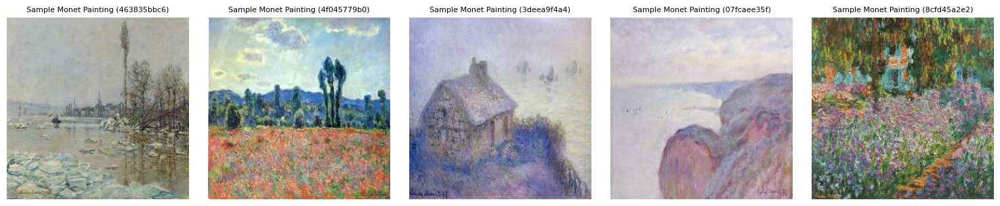

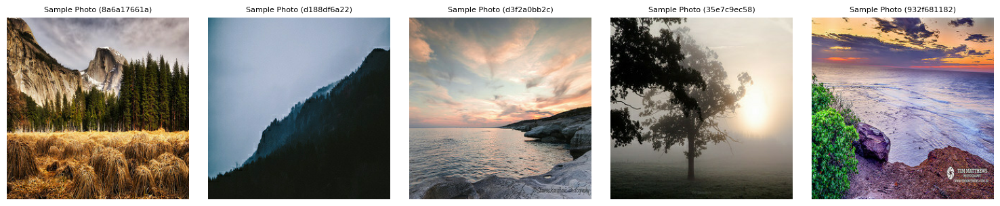

In [5]:
# Load one image and decode JPEG
def load_and_decode_image(tfrecord_file):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    tfrecord = tf.io.parse_single_example(tfrecord_file, tfrecord_format)
    image = tf.image.decode_jpeg(tfrecord['image'], channels=3)
    return image, tfrecord['image_name']

# Display random images
def display_random_images(tfrecord_file, buffer_size=BUFFER_SIZE, num_samples=5, title='Image Samples'):
    dataset = tf.data.TFRecordDataset(tfrecord_file, num_parallel_reads=AUTOTUNE)
    dataset = dataset.map(load_and_decode_image, num_parallel_calls=AUTOTUNE)
    dataset = dataset.shuffle(
        buffer_size=buffer_size, reshuffle_each_iteration=True).take(num_samples)
    
    plt.figure(figsize=(num_samples*3, 3))
    
    for i, (image, image_name) in enumerate(dataset):
        if i>=num_samples:
            break
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(image.numpy())
        plt.title(f"{title} ({image_name.numpy().decode()})", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Display Monet painting samples
display_random_images(MONET_FILENAMES, buffer_size=BUFFER_SIZE, 
                      num_samples=5, title='Sample Monet Painting')

# Display photo samples
display_random_images(PHOTO_FILENAMES, buffer_size=BUFFER_SIZE, 
                      num_samples=5 , title='Sample Photo')

### 3.2. Loading Dataset and Preprocessing

We're going to load the dataset and preprocess images, including: 

- Normalization: Normalizing image pixel values to the range of [-1, 1] to align with the *tanh* activation function in the Generator's output layer
- Data Augmentation: Introduce random variability and noise into the training data.

In [6]:
# process single image: normalization & augmentation
def process_image(tfrecord_file, is_source=True):
    # Load image
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    tfrecord = tf.io.parse_single_example(tfrecord_file, tfrecord_format)
    # Decode JPG
    image = tf.image.decode_jpeg(tfrecord['image'], channels=3)
    if is_source:
        # Data augmentation using random crop and flip horizontally
        # Resize images to 286 x 286
        image = tf.image.resize(image, [286, 286], 
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        # Randomly crop to 256 x 256
        image = tf.image.random_crop(image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
        # Randomly flip horizontally
        image = tf.image.random_flip_left_right(image)
    # Normalize pixel values to [-1, 1]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

# load dataset
def load_dataset(tfrecord_files, is_source=True, buffer_size=BUFFER_SIZE, load_records=0):
    dataset = tf.data.TFRecordDataset(tfrecord_files)
    dataset = dataset.map(lambda x: process_image(x, is_source), 
                          num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.cache()
    dataset = dataset.shuffle(buffer_size=buffer_size)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    if load_records>0:
        dataset = dataset.take(load_records)
    return dataset

# Create TF.data datasets
train_ds_monet = load_dataset(MONET_FILENAMES, is_source=True)
train_ds_photo = load_dataset(PHOTO_FILENAMES, is_source=True)

# Repeat for training
train_ds_monet = train_ds_monet.repeat()
train_ds_photo = train_ds_photo.repeat()

# Take one Monet painting and one photo for visualization during training
test_ds_monet = load_dataset(MONET_FILENAMES, is_source=False, load_records=1)
test_ds_photo = load_dataset(PHOTO_FILENAMES, is_source=False, load_records=1)
test_monet = next(iter(test_ds_monet))
test_photo = next(iter(test_ds_photo))

print(f"Monet painting shape: {test_monet.shape}, Type: {test_monet.dtype}")
print(f"Photo shape: {test_photo.shape}, Type: {test_photo.dtype}")

Monet painting shape: (1, 256, 256, 3), Type: <dtype: 'float32'>
Photo shape: (1, 256, 256, 3), Type: <dtype: 'float32'>


## 4. Generative Adversarial Networks (GANs)

This challenge requires us to build a GAN network to generate 7,000 to 10,000 images from a set of 7,000+ photos and 300 Monet paintings, so the CycleGAN model is a good choice for this kind of unpaired image-to-image translation problem.

Now let's build our CycleGAN model.

**Generator (U-Net/ResNet)**: We'll be using U-Net Architecture for our Generator. The U-Net Architecture consists of two main paths:

- Encoder (Contracting Path): This is the left side of the "U" and functions like a traditional convolutional neural network for feature extraction. This part of the network consists of repeated blocks of: 
    - Convolutional layers: To learn hierarchical features from the input image
    - Activation functions (e.g., ReLU): To introduce non-linearity.
    - Max-pooling layers: To progressively downsample the feature maps, reducing their spatial dimensions. This captures context and higher-level, more abstract features.

- Decoder (Expanding Path): This is the right side of the "U" and aims to precisely localize features and reconstruct the segmentation map back to the original input image's resolution. This part of the network consists of repeated blocks of:
    - Upsampling (e.g., Transposed Convolutions or Nearest Neighbor + Conv): Increases the spatial dimensions of the feature maps.
    - Concatenation (Skip Connections): This is the most critical part of U-Net. The upsampled feature maps from the expansive path are directly merged with the corresponding high-resolution feature maps from the contracting path (at the same spatial level). These "skip connections" provide the decoder with fine-grained spatial information that might have been lost during the downsampling process in the encoder.
    - Convolutional layers: To refine the features after concatenation and produce the final segmentation.

**Discriminator (PatchGAN)**

We'll be using PatchGAN to implement for our Discriminator. It's just a standard convolutional neural network (CNN) but its final layers are configured such that the output is not a single scalar (whether the whole image is real or fake), but a 2D feature map where each value judges if the corresponding patch (local region of the image) is real or fake.

### 4.1. Generator & Discriminator Implementation

In [7]:
# reduce the spatial resolution by a factor of 2
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        layers.Conv2D(filters, size, strides=2, padding='same',
                      kernel_initializer=initializer, use_bias=False)
    )
    if apply_batchnorm:
        result.add(layers.GroupNormalization(groups=-1))
        #result.add(layers.BatchNormalization())
    result.add(layers.LeakyReLU())
    return result

# increase the spatial resolution by a factor of 2 
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(
        layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False)
    )
    result.add(layers.GroupNormalization(groups=-1))
    #result.add(layers.BatchNormalization())
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    result.add(layers.ReLU())
    return result

# Generator class
class Generator():
    def __init__(self, input_shape, block_filters, name='Generator'):
        self.name = name
        self.shape = input_shape
        self.block_filters = block_filters
    def generator(self):
        inputs = layers.Input(shape=self.shape)

        n_blocks = len(self.block_filters)

        # Downsampling (Encoder)
        down_stack = []
        for n in range(n_blocks):
            filters, size, apply_batchnorm = self.block_filters[n]
            down_stack.append(downsample(filters, size, apply_batchnorm))
        
        # Upsampling (Decoder)
        up_stack = []
        for n in range(n_blocks-2,-1,-1):
            filters, size, apply_dropout = self.block_filters[n]
            up_stack.append(upsample(filters, size, apply_dropout))
    
        initializer = tf.random_normal_initializer(0., 0.02)
        last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh')

        x = inputs
    
        # Downsampling through the model
        skips = []
        for down in down_stack:
            x = down(x)
            skips.append(x)

        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            x = layers.Concatenate()([x, skip])

        x = last(x)

        return tf.keras.Model(inputs=inputs, outputs=x, name=self.name)

# Discriminator class
class Discriminator():
    def __init__(self, input_shape, block_filters, name='Discriminator'):
        self.name = name
        self.shape = input_shape
        self.block_filters = block_filters

    def discriminator(self):
        initializer = tf.random_normal_initializer(0., 0.02)
        inputs = layers.Input(shape=self.shape)
        x = inputs
        n_blocks = len(self.block_filters)
        for n in range(n_blocks):
            filters, size, apply_batchnorm = self.block_filters[n]
            x = downsample(filters, size, apply_batchnorm)(x)
        x = layers.ZeroPadding2D()(x)
        x = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                         use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.ZeroPadding2D()(x)
        last = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x)
        return tf.keras.Model(inputs=inputs, outputs=last, name=self.name)

### 4.2. CycleGAN Model Class

In [8]:
class CycleGAN():
    def __init__(self, shape, g_block_filters, d_block_filters, learning_rate=2e-4, beta_1=0.5):
        self.gen_photo = Generator(
                input_shape=shape, 
                block_filters=g_block_filters,
                name='photo_generator').generator() 
        self.gen_monet = Generator(
                input_shape=shape, 
                block_filters=g_block_filters,
                name='monet_generator').generator() 
        self.disc_photo = Discriminator(
                input_shape=shape, 
                block_filters=d_block_filters,
                name='photo_discriminator').discriminator()
        self.disc_monet = Discriminator(
                input_shape=shape, 
                block_filters=d_block_filters,
                name='monet_discriminator').discriminator()
        self.gen_photo_optimizer = Adam(learning_rate, beta_1=beta_1)
        self.gen_monet_optimizer = Adam(learning_rate, beta_1=beta_1)
        self.disc_photo_optimizer = Adam(learning_rate, beta_1=beta_1)
        self.disc_monet_optimizer = Adam(learning_rate, beta_1=beta_1)

    #Print photo generator architecture
    def gen_photo_summary(self):
        self.gen_photo.summary()
        print()
        
    #Print monet generator architecture
    def gen_monet_summary(self):
        self.gen_monet.summary()
        print()
        
    #Print photo discriminator architecture
    def disc_photo_summary(self):
        self.disc_photo.summary()
        print()
        
    #Print monet discriminator architecture
    def disc_monet_summary(self):
        self.disc_monet.summary()
        print()
        
    # Generator loss
    def gen_loss(self, generated):
        return BinaryCrossentropy(
            from_logits=True,
        )(tf.ones_like(generated), generated)

    # Discriminator loss
    def disc_loss(self, real, generated):
        real_loss =  BinaryCrossentropy(
            from_logits=True,
        )(tf.ones_like(real), real)
        generated_loss =  BinaryCrossentropy(
            from_logits=True,
        )(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        # Scale by 0.5 as suggested in original GAN paper
        total_disc_loss = total_disc_loss * 0.5
        return total_disc_loss

    # Cycled loss
    def cycle_loss(self, real_image, cycled_image, lambda_cycle=10.0):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return lambda_cycle * loss1

    # Identity loss
    def identity_loss(self, real_image, same_image, lambda_cycle=10.0):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return 0.5 * lambda_cycle * loss

    @tf.function
    def train_step(self, real_monet, real_photo):
        with tf.GradientTape(persistent=True) as tape:
            # monet painting -> photo -> monet painting
            fake_photo = self.gen_photo(real_monet, training=True)
            cycled_monet = self.gen_monet(fake_photo, training=True)
            # photo -> monet painting -> photo
            fake_monet = self.gen_monet(real_photo, training=True) 
            cycled_photo = self.gen_photo(fake_monet, training=True)
            # Identity mapping, generate itself
            same_photo = self.gen_photo(real_photo, training=True)
            same_monet = self.gen_monet(real_monet, training=True)
            # Discriminator output on real images
            disc_real_monet = self.disc_monet(real_monet, training=True)
            disc_real_photo = self.disc_photo(real_photo, training=True)
            # Discriminator output on fake images
            disc_fake_monet = self.disc_monet(fake_monet, training=True)
            disc_fake_photo = self.disc_photo(fake_photo, training=True)
            # Calculate generator losses
            gen_photo_loss = self.gen_loss(disc_fake_photo) 
            gen_monet_loss = self.gen_loss(disc_fake_monet)
            # Calculate cycle consistency loss
            total_cycle_loss = self.cycle_loss(real_monet, cycled_monet) + \
                           self.cycle_loss(real_photo, cycled_photo)
            # Total generator loss
            total_gen_monet_loss = gen_monet_loss + total_cycle_loss + \
                                self.identity_loss(real_monet, same_monet)
            total_gen_photo_loss = gen_photo_loss + total_cycle_loss + \
                                self.identity_loss(real_photo, same_photo)
            # Discriminator losses
            disc_monet_loss = self.disc_loss(disc_real_monet, disc_fake_monet)
            disc_photo_loss = self.disc_loss(disc_real_photo, disc_fake_photo)
        # Calculate generator gradients
        gen_monet_gradients = tape.gradient(total_gen_monet_loss, 
                                            self.gen_monet.trainable_variables)
        gen_photo_gradients = tape.gradient(total_gen_photo_loss, 
                                            self.gen_photo.trainable_variables)
        # Calculate discriminator gradients
        disc_monet_gradients = tape.gradient(disc_monet_loss, 
                                             self.disc_monet.trainable_variables)
        disc_photo_gradients = tape.gradient(disc_photo_loss, 
                                             self.disc_photo.trainable_variables)
        # Apply generator & discriminatorgradients
        self.gen_monet_optimizer.apply_gradients(
            zip(gen_monet_gradients, self.gen_monet.trainable_variables))
        self.gen_photo_optimizer.apply_gradients(
            zip(gen_photo_gradients, self.gen_photo.trainable_variables))
        self.disc_monet_optimizer.apply_gradients(
            zip(disc_monet_gradients, self.disc_monet.trainable_variables))
        self.disc_photo_optimizer.apply_gradients(
            zip(disc_photo_gradients, self.disc_photo.trainable_variables))
        
        return {
            "gen_photo_loss": total_gen_photo_loss,
            "gen_monet_loss": total_gen_monet_loss,
            "disc_photo_loss": disc_photo_loss,
            "disc_monet_loss": disc_monet_loss,
            "total_cycle_loss": total_cycle_loss,
        }
    
    # visualize generated test photos during training
    def visualize_images(self, test_input_monet, test_input_photo):
        generated_photo = self.gen_photo(test_input_monet, training=False)[0].numpy()
        generated_monet = self.gen_monet(test_input_photo, training=False)[0].numpy()
        # Rescale images from [-1, 1] to [0, 1] for plotting
        generated_photo = (generated_photo * 0.5 + 0.5)
        generated_monet = (generated_monet * 0.5 + 0.5)
        test_input_monet_plot = (test_input_monet[0].numpy() * 0.5 + 0.5)
        test_input_photo_plot = (test_input_photo[0].numpy() * 0.5 + 0.5)

        plt.figure(figsize=(10, 5))

        display_list = [test_input_monet_plot, 
                        generated_photo, 
                        test_input_photo_plot, 
                        generated_monet]
        title = ['Input Monet Painting', 
                 'Generated Photo', 
                 'Input Photo', 
                 'Generated Monet Painting']

        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.title(title[i], fontsize=8)
            image = np.clip(display_list[i], 0, 1)
            plt.imshow(image)
            plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    # Train model
    def fit(self, train_ds_monet, train_ds_photo, epochs, 
            steps_per_epoch=100, display_interval=5):
        train_history = {
            'epoch': 0,
            'history': {
                'gen_photo_loss': [],
                'gen_monet_loss': [],
                'disc_photo_loss': [],
                'disc_monet_loss': [],
                'total_cycle_loss': [],
            },
        }
        for epoch in range(epochs):
            print(f'Epoch {epoch+1}/{epochs}')
            train_history['epoch'] = epoch
            epoch_start_time = time.time()
            for step, (monet_painting, photo) in enumerate(tf.data.Dataset.zip((train_ds_monet, train_ds_photo))):
                if step >= steps_per_epoch:
                    break
                step_start_time = time.time()
                metrics = self.train_step(monet_painting, photo)
                step_end_time = time.time()
                step_duration = step_end_time - step_start_time
                avg_step_dura = time.time() - epoch_start_time
                avg_step_dura = avg_step_dura/(step+1)
                percent_complete = np.floor(100*(step+1)/steps_per_epoch)
                n_equal = int(((step+1)/steps_per_epoch)*20)
                progress = '=' * n_equal + ' ' * (20-n_equal)
                msg = f'{step+1}/{steps_per_epoch} {percent_complete:.0f}% [{progress}] - ' + \
                    f'{step_duration:.2f}s {avg_step_dura:.2f}s/step' + \
                    f'- gen_photo_loss: {metrics["gen_photo_loss"]:.4f} ' + \
                    f'- disc_photo_loss: {metrics["disc_photo_loss"]:.4f} ' + \
                    f'- gen_monet_loss: {metrics["gen_monet_loss"]:.4f} ' + \
                    f'- disc_monet_loss: {metrics["disc_monet_loss"]:.4f} ' + \
                    f'- total_cycle_loss: {metrics["total_cycle_loss"]:.4f}'
                if step == steps_per_epoch - 1:
                    print(msg)
                else:
                    print(msg, end='\r')
            # Generate images every at specific intervals
            if (epoch + 1) % display_interval == 0:
                self.visualize_images(test_monet, test_photo)

            for k, v in metrics.items():
                train_history['history'][k].append(float(v))
                
            print (f'Epoch {epoch+1}/{epochs} complete in {time.time()-epoch_start_time:.2f} seconds.')

        return train_history


### 4.3. Train CycleGAN Model

In [9]:
# Define number of blocks for generators & discriminators
# Test 1: 4 & 3 blocks 
g_block_filters_1 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
]

d_block_filters_1 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
]

# Test 2: 5 & 3 blocks 
g_block_filters_2 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
]

d_block_filters_2 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
]

# Test 3: 5 & 4 blocks
g_block_filters_3 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
]

d_block_filters_3 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
]

# Test 4: 6 & 3 blocks
g_block_filters_4 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
    (512, 4, True),
]

d_block_filters_4 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
]

# Test 5: 6 & 4 blocks 
g_block_filters_5 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
    (512, 4, True),
]

d_block_filters_5 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
]

# Test 6: 6 & 5 blocks
g_block_filters_6 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
    (512, 4, True),
]

d_block_filters_6 = [
    (64, 4, False),
    (128, 4, True),
    (256, 4, True),
    (512, 4, True),
    (512, 4, True),
]

# Select one of above architectures
# 1st run
#g_block_filters = g_block_filters_1
#_block_filters = d_block_filters_1
# 2nd run
#g_block_filters = g_block_filters_2
#d_block_filters = d_block_filters_2
# 3rd run
#g_block_filters = g_block_filters_3
#d_block_filters = d_block_filters_3
# 4th run
g_block_filters = g_block_filters_4
d_block_filters = d_block_filters_4
# 5th run
#g_block_filters = g_block_filters_5
#d_block_filters = d_block_filters_5
# 6th run
#g_block_filters = g_block_filters_6
#d_block_filters = d_block_filters_6

In [10]:
# Create CycleGAN Model
cyclegan = CycleGAN([IMG_WIDTH, IMG_HEIGHT, OUTPUT_CHANNELS], 
            g_block_filters, d_block_filters, learning_rate=2e-4, beta_1=0.5)

In [11]:
# View Generators Architecture
cyclegan.gen_photo_summary()
cyclegan.gen_monet_summary()

Model: "photo_generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,328 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    524,800 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,098,176 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,195,328 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,195,328 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 8, 8, 512) │  4,195,328 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 8, 8,      │          0 │ sequential_6[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 16, 16,    │  8,389,632 │ concatenate[0][0] │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 16, 16,    │          0 │ sequential_7[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 32, 32,    │  4,194,816 │ concatenate_1[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 32, 32,    │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 512)              │            │ sequential_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 64, 64,    │  1,048,832 │ concatenate_2[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 64, 64,    │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 256)              │            │ sequential_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 128, 128,  │    262,272 │ concatenate_3[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 128, 128,  │          0 │ sequential_10[0]

 Total params: 29,245,059 (111.56 MB)

 Trainable params: 29,245,059 (111.56 MB)

 Non-trainable params: 0 (0.00 B)

Model: "monet_generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 128, 128,  │      3,072 │ input_layer_12[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_12       │ (None, 64, 64,    │    131,328 │ sequential_11[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_13       │ (None, 32, 32,    │    524,800 │ sequential_12[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_14       │ (None, 16, 16,    │  2,098,176 │ sequential_13[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 8, 8, 512) │  4,195,328 │ sequential_14[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 4, 4, 512) │  4,195,328 │ sequential_15[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 8, 8, 512) │  4,195,328 │ sequential_16[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 8, 8,      │          0 │ sequential_17[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_15[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_18       │ (None, 16, 16,    │  8,389,632 │ concatenate_5[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 16, 16,    │          0 │ sequential_18[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_14[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_19       │ (None, 32, 32,    │  4,194,816 │ concatenate_6[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 32, 32,    │          0 │ sequential_19[0]… │
│ (Concatenate)       │ 512)              │            │ sequential_13[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_20       │ (None, 64, 64,    │  1,048,832 │ concatenate_7[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 64, 64,    │          0 │ sequential_20[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_12[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_21       │ (None, 128, 128,  │    262,272 │ concatenate_8[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 128, 128,  │          0 │ sequential_21[0]

 Total params: 29,245,059 (111.56 MB)

 Trainable params: 29,245,059 (111.56 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
# View Discriminators Architecture
cyclegan.disc_photo_summary()
cyclegan.disc_monet_summary()

Model: "photo_discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_22 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_23 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_24 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 34, 34, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 31, 31, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_1                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,766,593 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,024 (4.00 KB)

Model: "monet_discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_28 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_25 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_26 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_27 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_2                │ (None, 34, 34, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 31, 31, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_3                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,766,593 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [13]:
# Calculate steps per epoch
steps_per_epoch = min(NUM_PAINTINGS, NUM_PHOTOS)
print('Steps per epoch:', steps_per_epoch)

Steps per epoch: 300


Starting CycleGAN training...
Epoch 1/100


E0000 00:00:1755052898.688537      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape ingradient_tape/monet_generator_5/sequential_20_1/dropout_7_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1755052900.870025      69 cuda_dnn.cc:529] Loaded cuDNN version 90300


300/300 100% [====================] - 0.25s 0.44s/step- gen_photo_loss: 3.3107 - disc_photo_loss: 0.7423 - gen_monet_loss: 4.0120 - disc_monet_loss: 0.7465 - total_cycle_loss: 2.3197
Epoch 1/100 complete in 133.34 seconds.
Epoch 2/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2478 - disc_photo_loss: 1.1732 - gen_monet_loss: 3.5513 - disc_monet_loss: 1.3530 - total_cycle_loss: 2.2770
Epoch 2/100 complete in 97.08 seconds.
Epoch 3/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.7291 - disc_photo_loss: 0.8729 - gen_monet_loss: 4.3159 - disc_monet_loss: 1.0184 - total_cycle_loss: 2.6485
Epoch 3/100 complete in 96.97 seconds.
Epoch 4/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2059 - disc_photo_loss: 0.6643 - gen_monet_loss: 2.8065 - disc_monet_loss: 0.6507 - total_cycle_loss: 1.7434
Epoch 4/100 complete in 97.10 seconds.
Epoch 5/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_pho

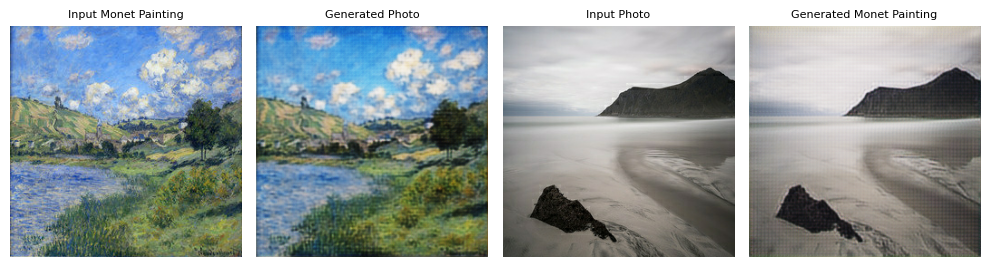

Epoch 5/100 complete in 97.67 seconds.
Epoch 6/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.5411 - disc_photo_loss: 0.8692 - gen_monet_loss: 2.9528 - disc_monet_loss: 0.8492 - total_cycle_loss: 2.0150
Epoch 6/100 complete in 97.24 seconds.
Epoch 7/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.5232 - disc_photo_loss: 0.7278 - gen_monet_loss: 2.2007 - disc_monet_loss: 0.8280 - total_cycle_loss: 1.6008
Epoch 7/100 complete in 97.28 seconds.
Epoch 8/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9640 - disc_photo_loss: 0.6659 - gen_monet_loss: 3.4175 - disc_monet_loss: 0.8158 - total_cycle_loss: 1.9180
Epoch 8/100 complete in 97.11 seconds.
Epoch 9/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8887 - disc_photo_loss: 0.3587 - gen_monet_loss: 2.7806 - disc_monet_loss: 0.3546 - total_cycle_loss: 1.2238
Epoch 9/100 complete in 97.19 seconds.
Epoch 10/100
300/300 100%

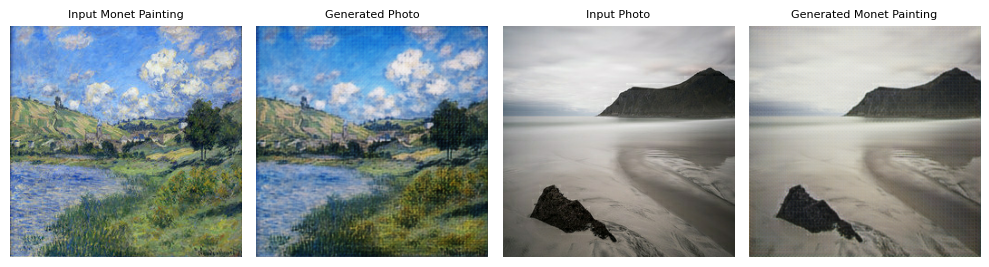

Epoch 10/100 complete in 97.52 seconds.
Epoch 11/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.5390 - disc_photo_loss: 0.5743 - gen_monet_loss: 3.1341 - disc_monet_loss: 0.6889 - total_cycle_loss: 1.5670
Epoch 11/100 complete in 97.16 seconds.
Epoch 12/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8178 - disc_photo_loss: 0.4355 - gen_monet_loss: 2.2707 - disc_monet_loss: 0.5156 - total_cycle_loss: 1.2817
Epoch 12/100 complete in 97.25 seconds.
Epoch 13/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9267 - disc_photo_loss: 0.6718 - gen_monet_loss: 2.0020 - disc_monet_loss: 0.7352 - total_cycle_loss: 1.3398
Epoch 13/100 complete in 97.24 seconds.
Epoch 14/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8933 - disc_photo_loss: 0.4553 - gen_monet_loss: 2.0890 - disc_monet_loss: 0.4615 - total_cycle_loss: 1.1676
Epoch 14/100 complete in 97.15 seconds.
Epoch 15/100
300

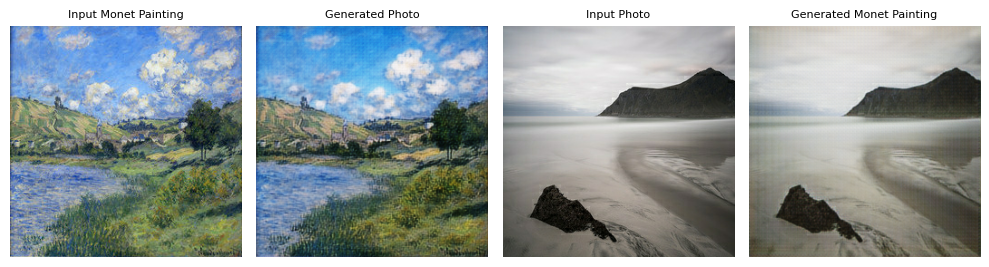

Epoch 15/100 complete in 97.59 seconds.
Epoch 16/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.1166 - disc_photo_loss: 0.7641 - gen_monet_loss: 2.5270 - disc_monet_loss: 0.6294 - total_cycle_loss: 1.1961
Epoch 16/100 complete in 97.18 seconds.
Epoch 17/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.2483 - disc_photo_loss: 0.4301 - gen_monet_loss: 2.6760 - disc_monet_loss: 0.5470 - total_cycle_loss: 1.3521
Epoch 17/100 complete in 97.07 seconds.
Epoch 18/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1885 - disc_photo_loss: 0.3888 - gen_monet_loss: 3.2104 - disc_monet_loss: 0.3751 - total_cycle_loss: 1.6763
Epoch 18/100 complete in 97.26 seconds.
Epoch 19/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 1.8291 - disc_photo_loss: 0.8767 - gen_monet_loss: 2.4143 - disc_monet_loss: 1.0875 - total_cycle_loss: 1.3089
Epoch 19/100 complete in 97.09 seconds.
Epoch 20/100
300

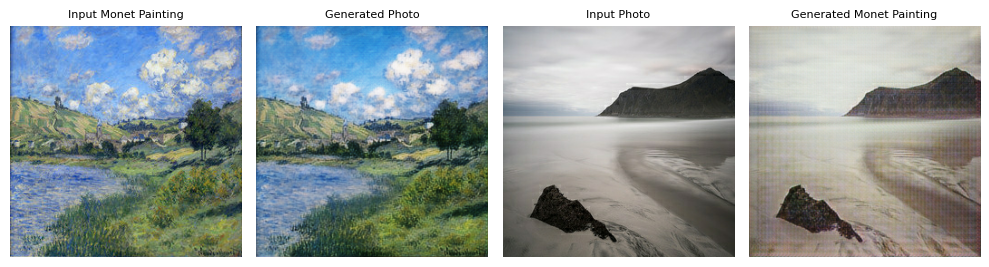

Epoch 20/100 complete in 97.51 seconds.
Epoch 21/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6429 - disc_photo_loss: 0.4292 - gen_monet_loss: 2.2618 - disc_monet_loss: 0.4743 - total_cycle_loss: 1.2885
Epoch 21/100 complete in 97.24 seconds.
Epoch 22/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6720 - disc_photo_loss: 0.7589 - gen_monet_loss: 2.3845 - disc_monet_loss: 0.4948 - total_cycle_loss: 1.2199
Epoch 22/100 complete in 97.08 seconds.
Epoch 23/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4253 - disc_photo_loss: 0.4443 - gen_monet_loss: 2.4140 - disc_monet_loss: 0.7519 - total_cycle_loss: 1.3818
Epoch 23/100 complete in 96.50 seconds.
Epoch 24/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4845 - disc_photo_loss: 0.7246 - gen_monet_loss: 2.0305 - disc_monet_loss: 0.6939 - total_cycle_loss: 1.3130
Epoch 24/100 complete in 96.69 seconds.
Epoch 25/100
300

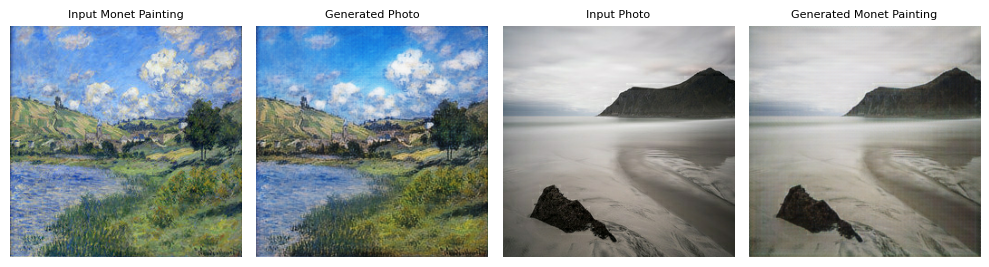

Epoch 25/100 complete in 97.37 seconds.
Epoch 26/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.6525 - disc_photo_loss: 0.6092 - gen_monet_loss: 3.3328 - disc_monet_loss: 0.5341 - total_cycle_loss: 2.1441
Epoch 26/100 complete in 96.78 seconds.
Epoch 27/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1376 - disc_photo_loss: 0.8409 - gen_monet_loss: 2.5499 - disc_monet_loss: 0.8008 - total_cycle_loss: 1.7051
Epoch 27/100 complete in 96.84 seconds.
Epoch 28/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.0493 - disc_photo_loss: 0.4600 - gen_monet_loss: 2.7135 - disc_monet_loss: 0.5763 - total_cycle_loss: 1.4687
Epoch 28/100 complete in 96.80 seconds.
Epoch 29/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9213 - disc_photo_loss: 0.5561 - gen_monet_loss: 2.6013 - disc_monet_loss: 0.5827 - total_cycle_loss: 1.5291
Epoch 29/100 complete in 96.73 seconds.
Epoch 30/100
300

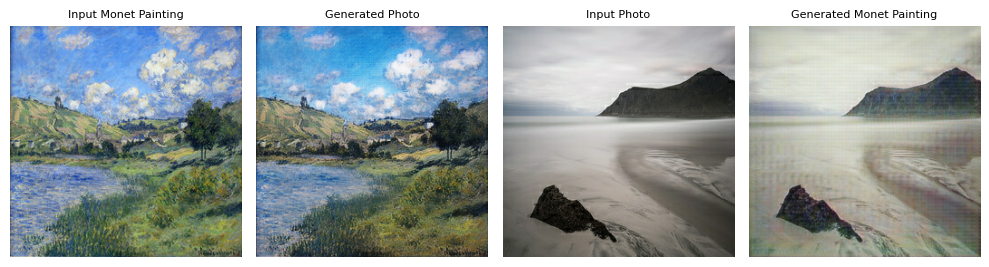

Epoch 30/100 complete in 97.38 seconds.
Epoch 31/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2763 - disc_photo_loss: 0.8161 - gen_monet_loss: 2.8704 - disc_monet_loss: 0.6409 - total_cycle_loss: 1.7408
Epoch 31/100 complete in 96.87 seconds.
Epoch 32/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8282 - disc_photo_loss: 0.4010 - gen_monet_loss: 2.4786 - disc_monet_loss: 0.6069 - total_cycle_loss: 1.5211
Epoch 32/100 complete in 96.89 seconds.
Epoch 33/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.2140 - disc_photo_loss: 0.5820 - gen_monet_loss: 2.5915 - disc_monet_loss: 0.6790 - total_cycle_loss: 1.3275
Epoch 33/100 complete in 96.88 seconds.
Epoch 34/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.5758 - disc_photo_loss: 0.4289 - gen_monet_loss: 2.4116 - disc_monet_loss: 0.6878 - total_cycle_loss: 1.3411
Epoch 34/100 complete in 96.86 seconds.
Epoch 35/100
300

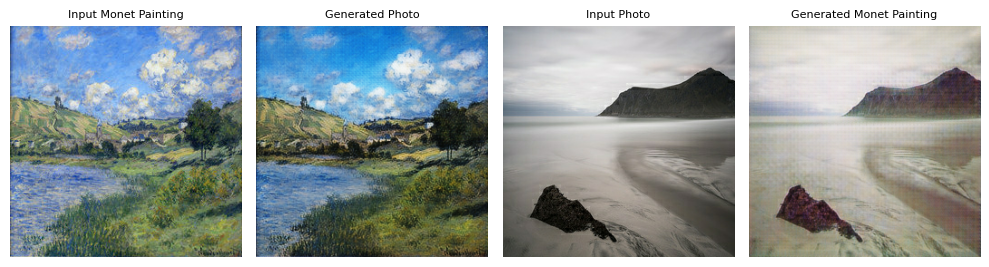

Epoch 35/100 complete in 97.23 seconds.
Epoch 36/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.1647 - disc_photo_loss: 1.0331 - gen_monet_loss: 2.3261 - disc_monet_loss: 0.9206 - total_cycle_loss: 1.4990
Epoch 36/100 complete in 96.88 seconds.
Epoch 37/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4457 - disc_photo_loss: 0.6696 - gen_monet_loss: 2.5035 - disc_monet_loss: 0.5571 - total_cycle_loss: 1.5694
Epoch 37/100 complete in 96.71 seconds.
Epoch 38/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.1288 - disc_photo_loss: 0.5882 - gen_monet_loss: 3.1048 - disc_monet_loss: 0.7214 - total_cycle_loss: 1.3938
Epoch 38/100 complete in 96.67 seconds.
Epoch 39/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2256 - disc_photo_loss: 0.5523 - gen_monet_loss: 3.1678 - disc_monet_loss: 0.5777 - total_cycle_loss: 2.0516
Epoch 39/100 complete in 97.05 seconds.
Epoch 40/100
300

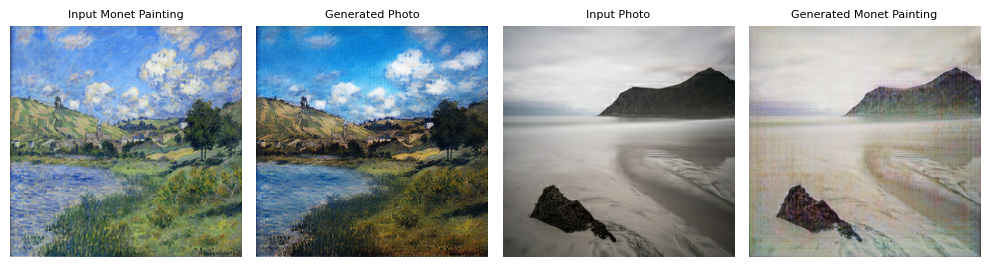

Epoch 40/100 complete in 97.07 seconds.
Epoch 41/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.0585 - disc_photo_loss: 0.5360 - gen_monet_loss: 3.6183 - disc_monet_loss: 0.4265 - total_cycle_loss: 1.9250
Epoch 41/100 complete in 96.82 seconds.
Epoch 42/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9397 - disc_photo_loss: 0.8694 - gen_monet_loss: 2.4477 - disc_monet_loss: 0.7485 - total_cycle_loss: 1.6689
Epoch 42/100 complete in 96.72 seconds.
Epoch 43/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2684 - disc_photo_loss: 0.6055 - gen_monet_loss: 2.5621 - disc_monet_loss: 0.6392 - total_cycle_loss: 1.6015
Epoch 43/100 complete in 96.82 seconds.
Epoch 44/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2340 - disc_photo_loss: 0.4656 - gen_monet_loss: 3.1487 - disc_monet_loss: 0.6078 - total_cycle_loss: 1.9702
Epoch 44/100 complete in 96.64 seconds.
Epoch 45/100
300

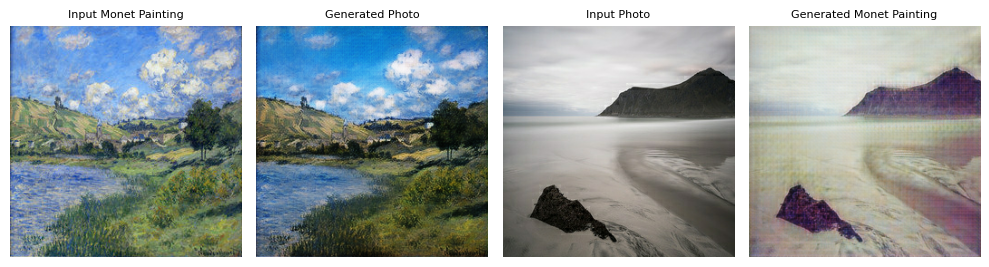

Epoch 45/100 complete in 97.26 seconds.
Epoch 46/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6460 - disc_photo_loss: 0.5729 - gen_monet_loss: 2.2747 - disc_monet_loss: 0.7476 - total_cycle_loss: 1.4724
Epoch 46/100 complete in 96.67 seconds.
Epoch 47/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.4288 - disc_photo_loss: 0.5946 - gen_monet_loss: 2.5639 - disc_monet_loss: 0.7424 - total_cycle_loss: 1.7648
Epoch 47/100 complete in 96.84 seconds.
Epoch 48/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.5006 - disc_photo_loss: 0.7563 - gen_monet_loss: 2.4670 - disc_monet_loss: 0.7965 - total_cycle_loss: 1.6037
Epoch 48/100 complete in 96.87 seconds.
Epoch 49/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6807 - disc_photo_loss: 0.5092 - gen_monet_loss: 2.6503 - disc_monet_loss: 0.6924 - total_cycle_loss: 1.5169
Epoch 49/100 complete in 96.89 seconds.
Epoch 50/100
300

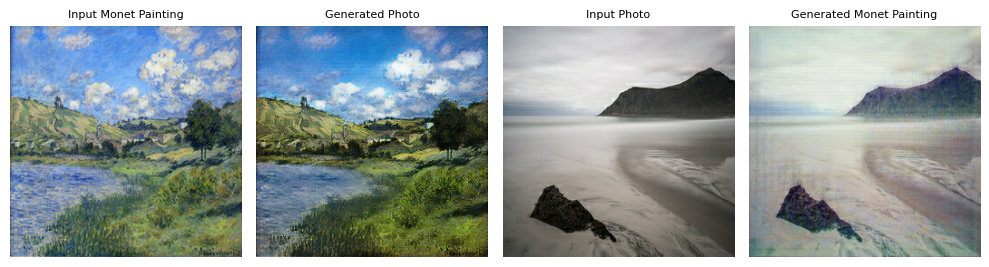

Epoch 50/100 complete in 97.51 seconds.
Epoch 51/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9556 - disc_photo_loss: 0.5223 - gen_monet_loss: 2.3925 - disc_monet_loss: 0.7485 - total_cycle_loss: 1.3623
Epoch 51/100 complete in 97.00 seconds.
Epoch 52/100
300/300 100% [====================] - 0.26s 0.32s/step- gen_photo_loss: 2.9156 - disc_photo_loss: 0.5383 - gen_monet_loss: 2.2796 - disc_monet_loss: 0.8316 - total_cycle_loss: 1.5893
Epoch 52/100 complete in 97.05 seconds.
Epoch 53/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.1917 - disc_photo_loss: 0.8047 - gen_monet_loss: 2.1028 - disc_monet_loss: 0.7640 - total_cycle_loss: 1.0230
Epoch 53/100 complete in 96.79 seconds.
Epoch 54/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.7955 - disc_photo_loss: 0.4743 - gen_monet_loss: 2.5718 - disc_monet_loss: 0.4647 - total_cycle_loss: 1.4215
Epoch 54/100 complete in 96.77 seconds.
Epoch 55/100
300

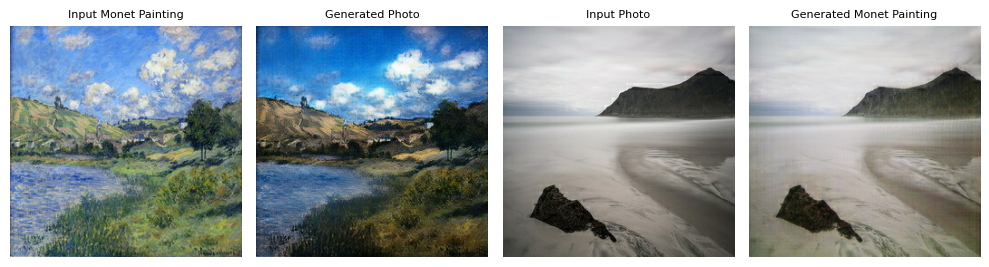

Epoch 55/100 complete in 97.34 seconds.
Epoch 56/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6786 - disc_photo_loss: 0.9213 - gen_monet_loss: 2.2320 - disc_monet_loss: 0.7293 - total_cycle_loss: 1.5997
Epoch 56/100 complete in 96.74 seconds.
Epoch 57/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1009 - disc_photo_loss: 0.6918 - gen_monet_loss: 2.5304 - disc_monet_loss: 0.7662 - total_cycle_loss: 1.5899
Epoch 57/100 complete in 96.83 seconds.
Epoch 58/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2029 - disc_photo_loss: 0.4957 - gen_monet_loss: 2.7180 - disc_monet_loss: 0.6766 - total_cycle_loss: 1.7797
Epoch 58/100 complete in 96.78 seconds.
Epoch 59/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1891 - disc_photo_loss: 0.5415 - gen_monet_loss: 2.7668 - disc_monet_loss: 0.4372 - total_cycle_loss: 1.6723
Epoch 59/100 complete in 96.65 seconds.
Epoch 60/100
300

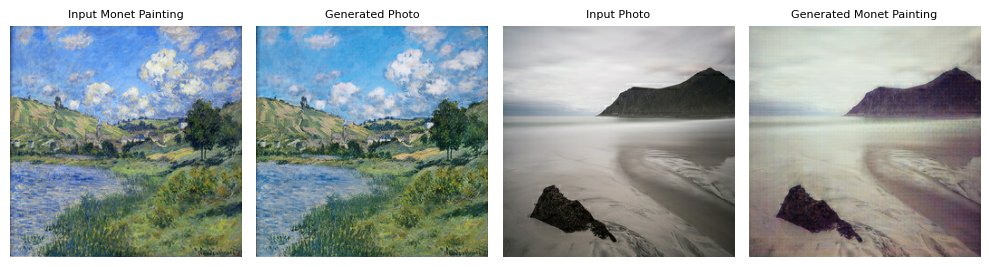

Epoch 60/100 complete in 97.71 seconds.
Epoch 61/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.7514 - disc_photo_loss: 0.8756 - gen_monet_loss: 2.9713 - disc_monet_loss: 0.7364 - total_cycle_loss: 1.8285
Epoch 61/100 complete in 97.42 seconds.
Epoch 62/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4309 - disc_photo_loss: 0.5868 - gen_monet_loss: 1.8108 - disc_monet_loss: 0.7381 - total_cycle_loss: 0.9502
Epoch 62/100 complete in 96.74 seconds.
Epoch 63/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1060 - disc_photo_loss: 0.6913 - gen_monet_loss: 2.5557 - disc_monet_loss: 0.6033 - total_cycle_loss: 1.7219
Epoch 63/100 complete in 96.82 seconds.
Epoch 64/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9936 - disc_photo_loss: 0.5801 - gen_monet_loss: 2.7320 - disc_monet_loss: 0.6092 - total_cycle_loss: 1.4775
Epoch 64/100 complete in 96.81 seconds.
Epoch 65/100
300

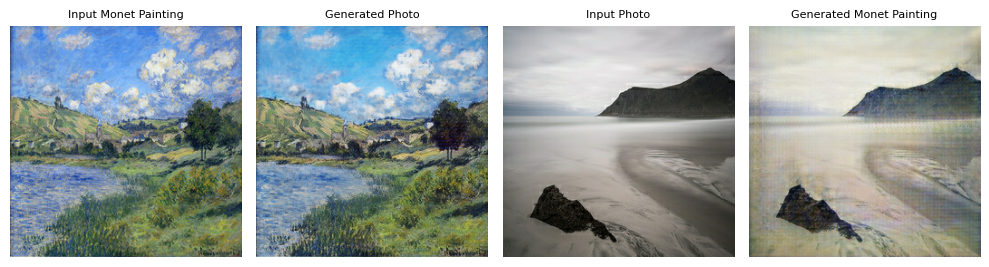

Epoch 65/100 complete in 97.38 seconds.
Epoch 66/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8986 - disc_photo_loss: 0.8504 - gen_monet_loss: 2.5282 - disc_monet_loss: 0.7259 - total_cycle_loss: 1.6271
Epoch 66/100 complete in 97.35 seconds.
Epoch 67/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1898 - disc_photo_loss: 0.6059 - gen_monet_loss: 2.6893 - disc_monet_loss: 0.4499 - total_cycle_loss: 1.6244
Epoch 67/100 complete in 96.94 seconds.
Epoch 68/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4674 - disc_photo_loss: 0.5089 - gen_monet_loss: 2.2491 - disc_monet_loss: 0.5370 - total_cycle_loss: 1.1861
Epoch 68/100 complete in 96.73 seconds.
Epoch 69/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8380 - disc_photo_loss: 0.5415 - gen_monet_loss: 2.0321 - disc_monet_loss: 0.6718 - total_cycle_loss: 1.3101
Epoch 69/100 complete in 96.78 seconds.
Epoch 70/100
300

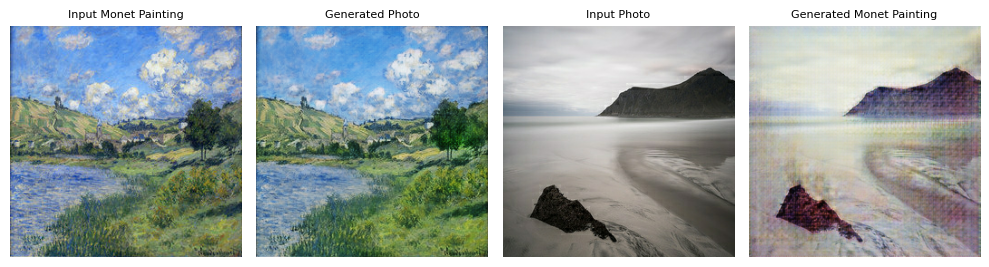

Epoch 70/100 complete in 97.36 seconds.
Epoch 71/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9573 - disc_photo_loss: 0.4317 - gen_monet_loss: 5.8189 - disc_monet_loss: 0.2652 - total_cycle_loss: 2.0413
Epoch 71/100 complete in 96.79 seconds.
Epoch 72/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.3303 - disc_photo_loss: 0.2126 - gen_monet_loss: 4.0860 - disc_monet_loss: 0.2574 - total_cycle_loss: 1.7311
Epoch 72/100 complete in 96.67 seconds.
Epoch 73/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1233 - disc_photo_loss: 0.9285 - gen_monet_loss: 2.4493 - disc_monet_loss: 0.7129 - total_cycle_loss: 1.5883
Epoch 73/100 complete in 96.74 seconds.
Epoch 74/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.3323 - disc_photo_loss: 1.0169 - gen_monet_loss: 2.4746 - disc_monet_loss: 0.5473 - total_cycle_loss: 1.5293
Epoch 74/100 complete in 96.86 seconds.
Epoch 75/100
300

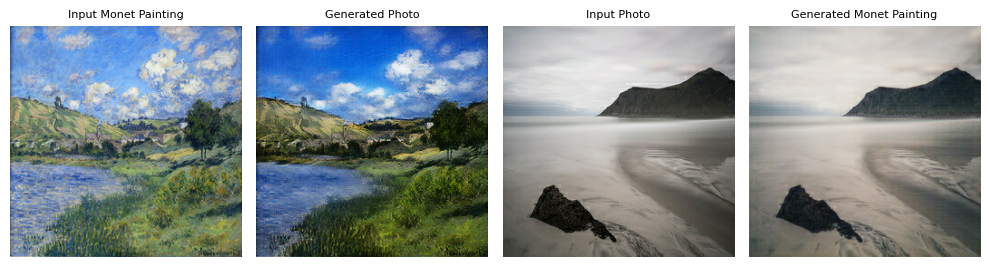

Epoch 75/100 complete in 97.37 seconds.
Epoch 76/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2018 - disc_photo_loss: 0.7069 - gen_monet_loss: 2.5599 - disc_monet_loss: 1.1900 - total_cycle_loss: 2.0240
Epoch 76/100 complete in 97.09 seconds.
Epoch 77/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.6793 - disc_photo_loss: 0.2561 - gen_monet_loss: 2.1537 - disc_monet_loss: 0.7440 - total_cycle_loss: 1.1170
Epoch 77/100 complete in 97.07 seconds.
Epoch 78/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4237 - disc_photo_loss: 0.6203 - gen_monet_loss: 2.0785 - disc_monet_loss: 0.6530 - total_cycle_loss: 1.0557
Epoch 78/100 complete in 96.88 seconds.
Epoch 79/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1771 - disc_photo_loss: 0.4562 - gen_monet_loss: 4.0085 - disc_monet_loss: 0.4855 - total_cycle_loss: 2.0399
Epoch 79/100 complete in 97.23 seconds.
Epoch 80/100
300

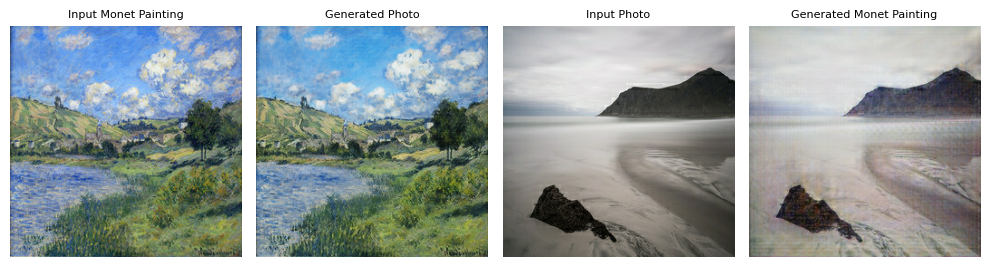

Epoch 80/100 complete in 97.35 seconds.
Epoch 81/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.3848 - disc_photo_loss: 0.5024 - gen_monet_loss: 3.4942 - disc_monet_loss: 0.3222 - total_cycle_loss: 1.9419
Epoch 81/100 complete in 97.15 seconds.
Epoch 82/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.0238 - disc_photo_loss: 0.5270 - gen_monet_loss: 3.4952 - disc_monet_loss: 0.4562 - total_cycle_loss: 1.5421
Epoch 82/100 complete in 96.53 seconds.
Epoch 83/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.5497 - disc_photo_loss: 0.4081 - gen_monet_loss: 3.6060 - disc_monet_loss: 0.2136 - total_cycle_loss: 1.8606
Epoch 83/100 complete in 96.92 seconds.
Epoch 84/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4447 - disc_photo_loss: 0.9765 - gen_monet_loss: 2.7011 - disc_monet_loss: 0.7465 - total_cycle_loss: 1.5917
Epoch 84/100 complete in 97.06 seconds.
Epoch 85/100
300

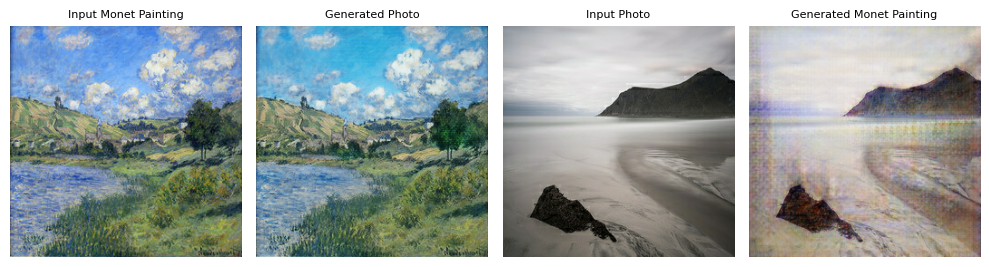

Epoch 85/100 complete in 97.12 seconds.
Epoch 86/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2757 - disc_photo_loss: 1.1002 - gen_monet_loss: 2.5380 - disc_monet_loss: 0.6509 - total_cycle_loss: 1.6843
Epoch 86/100 complete in 96.85 seconds.
Epoch 87/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.4169 - disc_photo_loss: 0.7611 - gen_monet_loss: 3.5764 - disc_monet_loss: 0.4668 - total_cycle_loss: 1.7350
Epoch 87/100 complete in 96.72 seconds.
Epoch 88/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.8448 - disc_photo_loss: 0.8793 - gen_monet_loss: 3.0654 - disc_monet_loss: 0.7697 - total_cycle_loss: 1.9591
Epoch 88/100 complete in 96.91 seconds.
Epoch 89/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.4703 - disc_photo_loss: 0.3429 - gen_monet_loss: 3.8357 - disc_monet_loss: 0.6526 - total_cycle_loss: 2.3903
Epoch 89/100 complete in 96.78 seconds.
Epoch 90/100
300

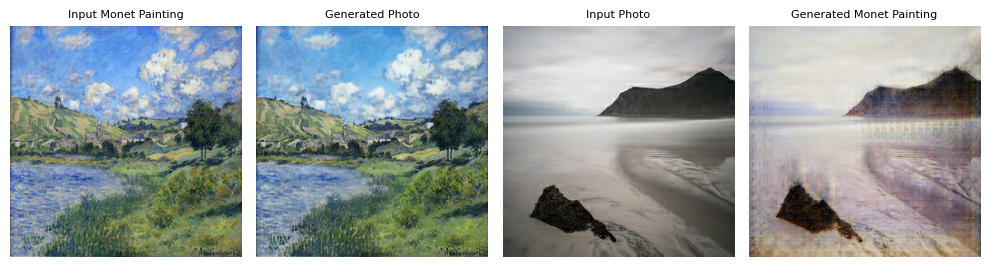

Epoch 90/100 complete in 97.19 seconds.
Epoch 91/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.2298 - disc_photo_loss: 0.2478 - gen_monet_loss: 4.5437 - disc_monet_loss: 0.2359 - total_cycle_loss: 1.8587
Epoch 91/100 complete in 96.85 seconds.
Epoch 92/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.3439 - disc_photo_loss: 0.5903 - gen_monet_loss: 3.9922 - disc_monet_loss: 0.7054 - total_cycle_loss: 2.3158
Epoch 92/100 complete in 97.13 seconds.
Epoch 93/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.5210 - disc_photo_loss: 0.3017 - gen_monet_loss: 2.9408 - disc_monet_loss: 0.6794 - total_cycle_loss: 1.7762
Epoch 93/100 complete in 96.81 seconds.
Epoch 94/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.5171 - disc_photo_loss: 0.3620 - gen_monet_loss: 3.0963 - disc_monet_loss: 0.5964 - total_cycle_loss: 1.6814
Epoch 94/100 complete in 97.17 seconds.
Epoch 95/100
300

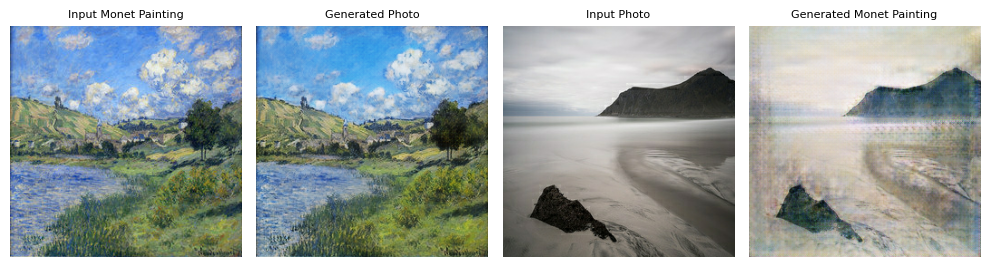

Epoch 95/100 complete in 97.39 seconds.
Epoch 96/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.3052 - disc_photo_loss: 0.4568 - gen_monet_loss: 3.9324 - disc_monet_loss: 0.2237 - total_cycle_loss: 1.3631
Epoch 96/100 complete in 96.77 seconds.
Epoch 97/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 2.9793 - disc_photo_loss: 0.5977 - gen_monet_loss: 3.4567 - disc_monet_loss: 0.5141 - total_cycle_loss: 1.8125
Epoch 97/100 complete in 96.88 seconds.
Epoch 98/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.1526 - disc_photo_loss: 0.5329 - gen_monet_loss: 2.9948 - disc_monet_loss: 0.3879 - total_cycle_loss: 1.5692
Epoch 98/100 complete in 97.09 seconds.
Epoch 99/100
300/300 100% [====================] - 0.25s 0.32s/step- gen_photo_loss: 3.0378 - disc_photo_loss: 0.5928 - gen_monet_loss: 2.8070 - disc_monet_loss: 0.4680 - total_cycle_loss: 1.3550
Epoch 99/100 complete in 97.04 seconds.
Epoch 100/100
30

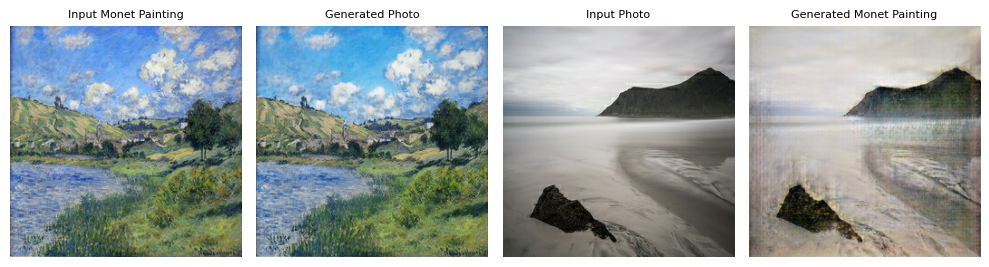

Epoch 100/100 complete in 97.28 seconds.
Training complete in 2 hours, 42 minutes and 18 seconds.


In [14]:
print("Starting CycleGAN training...")
TRAIN_EPOCHS=100
train_start_time = time.time()
history = cyclegan.fit(train_ds_monet, train_ds_photo, epochs=TRAIN_EPOCHS, 
                       steps_per_epoch=steps_per_epoch, display_interval=5)
train_duration = int(time.time() - train_start_time)
train_hours = train_duration//3600
train_duration = train_duration - 3600 * train_hours
train_mins = train_duration//60
train_secs = train_duration - 60 * train_mins

print(f"Training complete in {train_hours} hours, {train_mins} minutes and {train_secs} seconds.")

### 4.4. Visualize Generated Photo Results

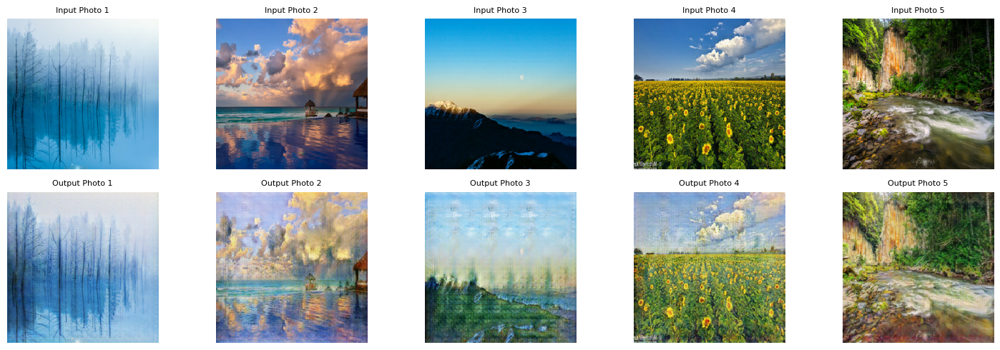

In [15]:
def visulaize_sample_result(train_ds_photo, num_samples=5):
    _, ax = plt.subplots(2, num_samples, figsize=(3 * num_samples, 5))
    for i, photo in enumerate(train_ds_photo.take(num_samples)):
        monet = cyclegan.gen_monet(photo, training=False)[0].numpy()
        monet = (monet * 127.5 + 127.5).astype(np.uint8)
        photo = (photo[0] * 127.5 + 127.5).numpy().astype(np.uint8)
        ax[0, i].imshow(photo)
        ax[0, i].set_title(f"Input Photo {i+1}", fontsize=8)
        ax[0, i].axis("off")
        ax[1, i].imshow(monet)
        ax[1, i].set_title(f"Output Photo {i+1}", fontsize=8)
        ax[1, i].axis("off")
    plt.tight_layout()
    plt.show()

visulaize_sample_result(train_ds_photo, num_samples=5)

### 4.5. Plot Model Training History

In [16]:
# Plot model training history & validation results
def plot_model_history(history):
    epochs = [epoch+1 for epoch in range(history['epoch']+1)]
    _, ax = plt.subplots(3, 1, figsize=(9, 9))
    
    ax[0].plot(epochs, history['history']['gen_photo_loss'], label='gen_photo_loss', )
    ax[0].plot(epochs, history['history']['disc_photo_loss'], label='disc_photo_loss')
    ax[0].set_title('Generator Loss', fontsize=8)
    ax[0].set_xlabel('Epoch', fontsize=8)
    ax[0].set_ylabel('Loss', fontsize=8)
    ax[0].grid()
    ax[0].legend()
    
    ax[1].plot(epochs, history['history']['gen_monet_loss'], label='gen_monet_loss')
    ax[1].plot(epochs, history['history']['disc_monet_loss'], label='disc_monet_loss')
    ax[1].set_title('Discriminator Loss', fontsize=8)
    ax[1].set_xlabel('Epoch', fontsize=8)
    ax[1].set_ylabel('Loss', fontsize=8)
    ax[1].grid()
    ax[1].legend()
    
    ax[2].plot(epochs, history['history']['total_cycle_loss'], label='total_cycle_loss')
    ax[2].set_title('Cycle Consistency Loss', fontsize=8)
    ax[2].set_xlabel('Epoch', fontsize=8)
    ax[2].set_ylabel('Loss', fontsize=8)
    ax[2].grid()
    ax[2].legend()
    
    plt.tight_layout()
    plt.show()
    

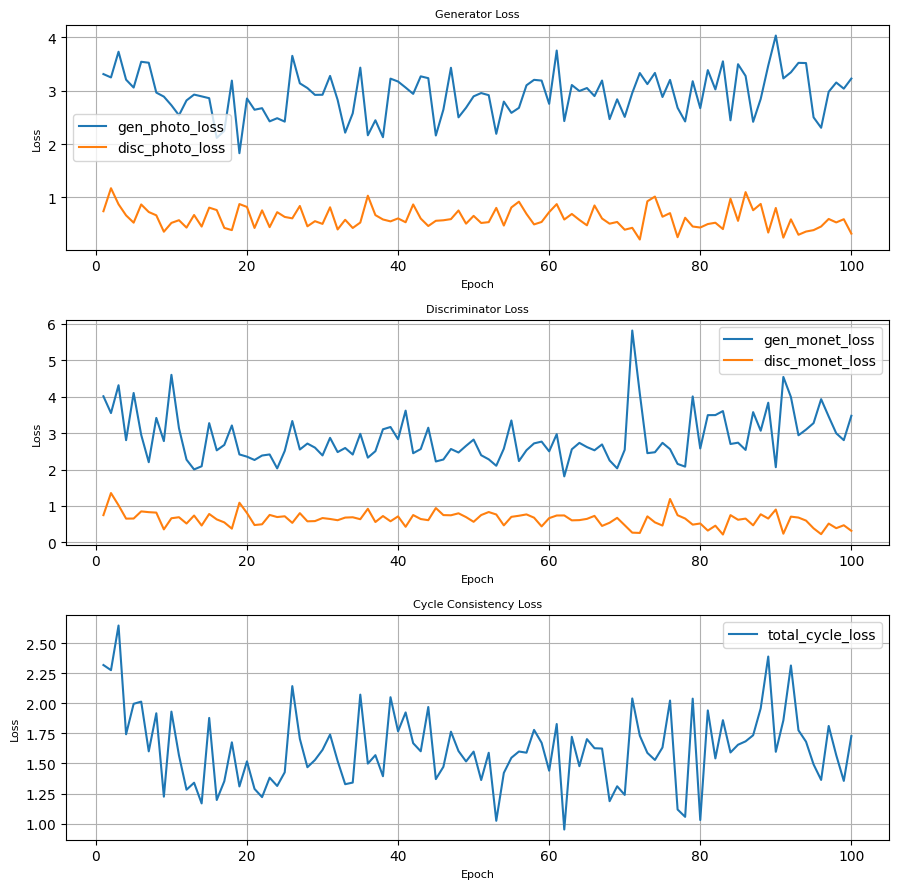

In [17]:
plot_model_history(history)

From the graph above we can see that the generator loss and discriminator loss both go up and down. It's because both the generator and discriminator are getting smarter as long as we train. 

### 4.6. Create Submission

In [18]:
import PIL
import shutil
# store final images
tf.io.gfile.makedirs(OUTPUT_DIR)
i = 1
for photo in train_ds_photo:
    print(f'Generating image {i}...', end='\r')
    monet = cyclegan.gen_monet(photo, training=False)[0].numpy()
    monet = (monet * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(monet)
    im.save(f'{OUTPUT_DIR}photo{i:04d}.jpg')
    if i>=NUM_PHOTOS:
        print(f'Generating image {i}... complete')
        break
    i += 1

shutil.make_archive(base_name=SUBMISSION_FILE, format='zip', root_dir=OUTPUT_DIR)

Generating image 7038... complete


'/kaggle/working/images.zip'

## 5. Results & Comparisons

I tried to run the notebook many times with different model architecture parameters. here are some of the results:

| Trial# | Generator Blocks | Discriminator Blocks | Training Epochs | Notebook Runtime | Kaggle Public Score |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 1 | 4 | 3 | 100 | 1h 26m 35s - GPU T4 x2 | 50.48670 |
| 2 | 5 | 3 | 100 | 2h 7m 27s - GPU T4 x2 | 43.73808 |
| 3 | 5 | 4 | 100 | 2h 12m 45s - GPU T4 x2 | 58.05313 |
| 4 | 6 | 3 | 100 | 2h 50m 13s · GPU T4 x2 | 42.75611 |
| 4 | 6 | 4 | 100 | 3h 3m 47s - GPU T4 x2 | 66.83757 |
| 5 | 6 | 5 | 100 | 3h 6m 6s - GPU T4 x2 | 130.51926 |

Here we can see that the outcome depend on how we choose the generator and discriminator blocks. When we increase the discriminator convolutional blocks, it become stronger and it's harder for the genertor to fool the discriminator. On the other hand, if we increase the generator residual blocks, it's become too strong and easily to fool the discriminator. In both cases, the results are bad. It's important to balance between the generator and discriminator. In the table above, the best score was 42.75611 when we build the generator with 6 res blocks and the discriminator with 3 blocks. 

## 6. Summary

In this project, we explored the dataset which includes 7000+ photos and 300 Monet painting images. We built our CycleGAN models to generate photo arts from the dataset. We tried to find the optimal model by tuning the model hyperparameters including the generator and discriminator blocks. 

Learnings and takeaways:

- CycleGAN is a good choice for this kind of unpaired immage-to-image translation.
- It's important to balance between the generator and the discriminator.

## 7. References

[1] Amy Jang, Monet CycleGAN Tutorial. [https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial)

[2] Keras CycleGAN Turtorial. [https://keras.io/examples/generative/cyclegan/](https://keras.io/examples/generative/cyclegan/)

[3] TensorFlow Tutorial, CycleGAN. [https://www.tensorflow.org/tutorials/generative/cyclegan](https://www.tensorflow.org/tutorials/generative/cyclegan)

[4] Generative Adversarial Networks. [arXiv:1406.2661](https://arxiv.org/abs/1406.2661)

[5] Jun-Yan Zhu, Taesung Park, Phillip Isola, Alexei A. Efros, "Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks”, 2017. [arXiv:1703.10593](https://arxiv.org/abs/1703.10593)

[6] Emami, Hajar, "Image-To-Image Translation With Deep Neural Networks" (2022). Wayne State University Dissertations. 3733.
[https://digitalcommons.wayne.edu/oa_dissertations/3733](https://digitalcommons.wayne.edu/oa_dissertations/3733)

[7] How CycleGAN Works? [https://developers.arcgis.com/python/latest/guide/how-cyclegan-works/](https://developers.arcgis.com/python/latest/guide/how-cyclegan-works/)

[8] CycleGAN: How AI Creates Stunning Image Transformations. [https://viso.ai/deep-learning/cyclegan/](https://viso.ai/deep-learning/cyclegan/)

[9] U-Net Architecture [https://en.wikipedia.org/wiki/U-Net](https://en.wikipedia.org/wiki/U-Net)

[10] U-Net Architecture Explained [https://www.geeksforgeeks.org/machine-learning/u-net-architecture-explained/](https://www.geeksforgeeks.org/machine-learning/u-net-architecture-explained/)